<a href="https://colab.research.google.com/github/yjkno1/AI_TEAM/blob/main/IsolationForest_3TAG_0330.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

**필요파일 Import**


In [ ]:
import csv
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from sklearn.ensemble import IsolationForest

import ftplib
import os
import pickle
from os import unlink

import plotly.express as px

# Google Drive 에서 파일 가져올때 사용
# from google.colab import drive
# drive.mount('/gdrive', force_remount=True)


**Dataframe 생성**

In [ ]:
# 위와같이 파일을 읽을때 date 컬럼의 타입을 지정할수 있고
# df['srvtime'] = pd.to_datetime(df['srvtime]) 이런형태로 나중에 변경 할수도 있다.

#csv_file = "http://yjkno1.synology.me:8081/file/ROUGHING_MILL_STAND10_ACTUAL_CURRENT_sample.csv"

csv_file = "http://yjkno1.synology.me:8081/file/TOP_9_TAG.csv"

df = pd.read_csv(csv_file, \
                 parse_dates=['srvtime'], \
                 infer_datetime_format=True)

df.describe()

df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7627651 entries, 0 to 7627650
Data columns (total 3 columns):
 #   Column   Dtype                                
---  ------   -----                                
 0   tag      object                               
 1   srvtime  datetime64[ns, pytz.FixedOffset(540)]
 2   value    float64                              
dtypes: datetime64[ns, pytz.FixedOffset(540)](1), float64(1), object(1)
memory usage: 174.6+ MB


**index 를 srvtime으로 재설정 하고 date의 분으로 평균값 구하여 재구성 한다.**


In [ ]:
df['tag'] = df['tag'].astype(str)

rDF = df[(df['srvtime'] >='2021-03-09 18:00') & (df['srvtime'] < '2021-03-10')]

rpmData = rDF[rDF['tag'] == 'SRL_2.2YH70.ROUGHING_MILL_STAND10_ACTUAL_SPEED_RPM'] # 669503
currentData = rDF[rDF['tag'] == 'SRL_2.2YH70.ROUGHING_MILL_STAND10_ACTUAL_CURRENT'] # 1047052
torqueData = rDF[rDF['tag'] == 'SRL_2.2YH70.ROUGHING_MILL_STAND10_ACTUAL_TORQUE'] # 1015070

rpmData=rpmData.set_index('srvtime').resample("1S").mean().reset_index()
currentData=currentData.set_index('srvtime').resample("1S").mean().reset_index()
torqueData=torqueData.set_index('srvtime').resample("1S").mean().reset_index()

# # 평균값의 소숫점을 1자리로 변경
rpmData['value']=round(rpmData['value'], 1)
currentData['value']=round(currentData['value'], 1)
torqueData['value']=round(torqueData['value'], 1)

# 보간(interpolation)을 활용한 결측치 대입
rpmData['value'] = pd.Series(rpmData['value']).interpolate()
currentData['value'] = pd.Series(currentData['value']).interpolate()
torqueData['value'] = pd.Series(torqueData['value']).interpolate()

# rpmData['value'].fillna(rpmData['value'].mean(), inplace = True)
# currentData['value'].fillna(currentData['value'].mean(), inplace = True)
# torqueData['value'].fillna(torqueData['value'].mean(), inplace = True)

print(rpmData.count())
print(currentData.count())
print(torqueData.count())

srvtime    21600
value      21600
dtype: int64
srvtime    21600
value      21600
dtype: int64
srvtime    21600
value      21600
dtype: int64


In [ ]:
x_train = rpmData

x_train['rpm'] = rpmData['value']
x_train['current'] = currentData['value']
x_train['torque'] = torqueData['value']

x_train

,srvtime,value,rpm,current,torque
0,2021-03-09 18:00:00+09:00,394.2,394.2,324.9,41.1
1,2021-03-09 18:00:01+09:00,393.9,393.9,334.6,42.3
2,2021-03-09 18:00:02+09:00,395.1,395.1,307.4,37.6
3,2021-03-09 18:00:03+09:00,395.8,395.8,302.7,35.6
4,2021-03-09 18:00:04+09:00,395.6,395.6,288.4,34.2
...,...,...,...,...,...
21595,2021-03-09 23:59:55+09:00,460.6,460.6,268.4,26.0
21596,2021-03-09 23:59:56+09:00,460.7,460.7,258.7,25.6
21597,2021-03-09 23:59:57+09:00,459.6,459.6,259.5,25.5
21598,2021-03-09 23:59:58+09:00,459.1,459.1,268.0,25.8


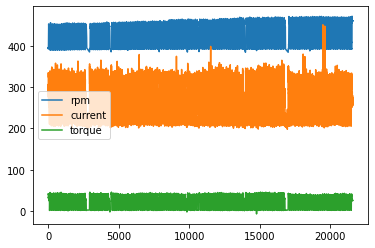

In [ ]:
x_train[["rpm", "current", "torque"]].plot()

**Model 만들기 함수**

In [ ]:
def isolation_forest_model(state_seed=20, n_estimators=100, max_samples=128, contamination=float(0.004)):
  state_value = np.random.RandomState(state_seed)
  return IsolationForest(n_estimators=n_estimators, max_samples=max_samples, contamination=contamination, random_state=state_value)


# ftp 접속 후 ftp객체 반환
def ftp_login(host, port, user, password):
  ftp=ftplib.FTP()
  ftp.connect(host,port)
  ftp.login(user, password)
  ftp.cwd("./")
  return ftp

# model을 ftp로 업로드
def save_model_to_ftp(ftp, filename):
  myfile = open(filename,'wb')
  # Save model
  pickle.dump(isol, myfile)
  ftpFile = open(filename, 'rb')
  ftp.storbinary("STOR /share/"+filename, ftpFile)
  myfile.close()
  ftpFile.close()

# ftp에서 model을 Load
def load_model_to_ftp(ftp, filename):
  myfile = open(filename,'wb')
  ftp.retrbinary("RETR /share/"+filename, myfile.write)
  myfile.close()
  ftpFile = open(filename, 'rb')
  isol = pickle.load(ftpFile)
  ftpFile.close()
  return isol



**Model 생성**

In [ ]:
isol = isolation_forest_model(20, 100, 128, float(0.0043))

isol

IsolationForest(behaviour='deprecated', bootstrap=False, contamination=0.0043,
                max_features=1.0, max_samples=128, n_estimators=100,
                n_jobs=None,
                random_state=RandomState(MT19937) at 0x7F6CA183BC00, verbose=0,
                warm_start=False)

In [ ]:
isol.fit(x_train[['rpm', 'current', 'torque']])


IsolationForest(behaviour='deprecated', bootstrap=False, contamination=0.0043,
                max_features=1.0, max_samples=128, n_estimators=100,
                n_jobs=None,
                random_state=RandomState(MT19937) at 0x7F6CA183BC00, verbose=0,
                warm_start=False)

**Model에 Fit할 데이터 전처리**

In [ ]:
x_rDF = df[df['srvtime'] >='2021-03-10']

x_rpmData = x_rDF[x_rDF['tag'] == 'SRL_2.2YH70.ROUGHING_MILL_STAND10_ACTUAL_SPEED_RPM'] # 669503
x_currentData = x_rDF[x_rDF['tag'] == 'SRL_2.2YH70.ROUGHING_MILL_STAND10_ACTUAL_CURRENT'] # 1047052
x_torqueData = x_rDF[x_rDF['tag'] == 'SRL_2.2YH70.ROUGHING_MILL_STAND10_ACTUAL_TORQUE'] # 1015070

# x_rpmData = x_rpmData[x_rpmData['srvtime'] >='2021-03-09']
# x_currentData = x_currentData[x_currentData['srvtime'] >='2021-03-09']
# x_torqueData = x_torqueData[x_torqueData['srvtime'] >='2021-03-09']

x_rpmData=x_rpmData.set_index('srvtime').resample("1S").mean().reset_index()
x_currentData=x_currentData.set_index('srvtime').resample("1S").mean().reset_index()
x_torqueData=x_torqueData.set_index('srvtime').resample("1S").mean().reset_index()

# # 평균값의 소숫점을 1자리로 변경
x_rpmData['value']=round(x_rpmData['value'], 1)
x_currentData['value']=round(x_currentData['value'], 1)
x_torqueData['value']=round(x_torqueData['value'], 1)

# 보간(interpolation)을 활용한 결측치 대입
x_rpmData['value'] = pd.Series(x_rpmData['value']).interpolate()
x_currentData['value'] = pd.Series(x_currentData['value']).interpolate()
x_torqueData['value'] = pd.Series(x_torqueData['value']).interpolate()

# x_rpmData['value'].fillna(x_rpmData['value'].mean(), inplace = True)
# x_currentData['value'].fillna(x_currentData['value'].mean(), inplace = True)
# x_torqueData['value'].fillna(x_torqueData['value'].mean(), inplace = True)

print(x_rpmData.count())
print(x_currentData.count())
print(x_torqueData.count())

srvtime    55302
value      55302
dtype: int64
srvtime    55302
value      55302
dtype: int64
srvtime    55302
value      55302
dtype: int64


In [ ]:
x_test = x_rpmData

x_test['rpm'] = x_rpmData['value']
x_test['current'] = x_currentData['value']
x_test['torque'] = x_torqueData['value']

x_test

,srvtime,value,rpm,current,torque
0,2021-03-10 00:00:00+09:00,460.6,460.6,260.2,25.5
1,2021-03-10 00:00:01+09:00,460.0,460.0,274.1,25.0
2,2021-03-10 00:00:02+09:00,460.3,460.3,263.0,23.3
3,2021-03-10 00:00:03+09:00,460.5,460.5,251.9,22.5
4,2021-03-10 00:00:04+09:00,462.4,462.4,245.0,16.7
...,...,...,...,...,...
55297,2021-03-10 15:21:37+09:00,419.8,419.8,273.4,28.5
55298,2021-03-10 15:21:38+09:00,420.1,420.1,257.8,28.3
55299,2021-03-10 15:21:39+09:00,419.0,419.0,282.0,28.4
55300,2021-03-10 15:21:40+09:00,418.9,418.9,264.4,28.3


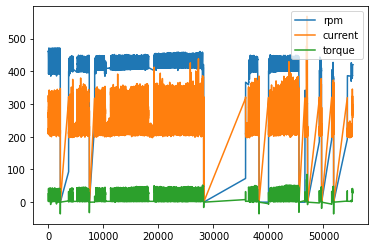

In [ ]:
x_test[['rpm','current', 'torque']].plot()

In [ ]:
series = isol.predict(x_test[['rpm', 'current', 'torque']])

series

x_test['outliers']=pd.Series(series).apply(lambda x: 'yes' if (x == -1) else 'no' )
print(x_test)

# 이상데이터 건수
print(x_test[x_test.outliers=='yes'].count())

# 정상데이터 건수
print(x_test[x_test.outliers=='no'].count())

                        srvtime  value    rpm  current  torque outliers
0     2021-03-10 00:00:00+09:00  460.6  460.6    260.2    25.5       no
1     2021-03-10 00:00:01+09:00  460.0  460.0    274.1    25.0       no
2     2021-03-10 00:00:02+09:00  460.3  460.3    263.0    23.3       no
3     2021-03-10 00:00:03+09:00  460.5  460.5    251.9    22.5       no
4     2021-03-10 00:00:04+09:00  462.4  462.4    245.0    16.7       no
...                         ...    ...    ...      ...     ...      ...
55297 2021-03-10 15:21:37+09:00  419.8  419.8    273.4    28.5       no
55298 2021-03-10 15:21:38+09:00  420.1  420.1    257.8    28.3       no
55299 2021-03-10 15:21:39+09:00  419.0  419.0    282.0    28.4       no
55300 2021-03-10 15:21:40+09:00  418.9  418.9    264.4    28.3       no
55301 2021-03-10 15:21:41+09:00  419.8  419.8    260.9    28.3       no

[55302 rows x 6 columns]
srvtime     17638
value       17638
rpm         17638
current     17638
torque      17638
outliers    17638
dt

**Scatter 그래프 API를 사용하여 데이터 시각화**


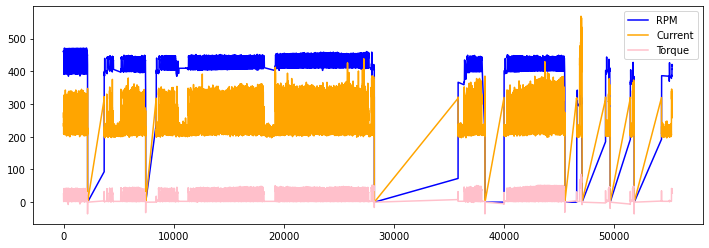

In [ ]:
#fig = px.scatter(df.reset_index(), x='srvtime', y='value', color='outliers', hover_data=['weekday', 'hour'], title='Anomaly Data')
# fig = px.scatter(x_test.reset_index(), x=['srvtime'], y=['rpm', 'current', 'torque'], color='outliers', hover_data=x_test, title='Anomaly Data')

#fig = px.scatter_matrix(x_test.reset_index(), dimensions=["rpm", "current", "torque"], color='outliers', hover_data=["rpm", "current", "torque"])
# subplot 적용

fig = plt.figure(figsize = (12, 4))
chart = fig.add_subplot(1,1,1)

chart.plot(x_test['rpm'], color='blue' , label='RPM')
chart.plot(x_test['current'], color='orange' , label='Current')
chart.plot(x_test['torque'], color='pink' , label='Torque')
# chart.plot(x_test['outliers'], color='red' , label='outliers')
plt.legend(loc = 'best')


# 범위를 선택해서 slider로 조절함.(범위 슬라이더)
# fig.update_xaxes(
#     rangeslider_visible=True,
# )
# fig.show()

In [ ]:
from plotly.subplots import make_subplots
import plotly.graph_objects as go

fig = make_subplots(rows=3, cols=1,
                    subplot_titles=['Rpm','Current','Torque'])


fig.append_trace(go.Line(x=x_test.srvtime, y=x_test.rpm), row=1, col=1)
fig.append_trace(go.Line(x=x_test.srvtime, y=x_test.current), row=2, col=1)
fig.append_trace(go.Line(x=x_test.srvtime, y=x_test.torque), row=3, col=1)

fig.update_layout(height=800, width=1000, title_text="Timeseries Decompose")
fig.show()

/usr/local/lib/python3.7/dist-packages/plotly/graph_objs/_deprecations.py:385: DeprecationWarning:

plotly.graph_objs.Line is deprecated.
Please replace it with one of the following more specific types
  - plotly.graph_objs.scatter.Line
  - plotly.graph_objs.layout.shape.Line
  - etc.




In [ ]:
from plotly.subplots import make_subplots
import plotly.graph_objects as go

fig = make_subplots(rows=3, cols=1,
                    subplot_titles=['Rpm','Current','Torque'])

clr = ["red" if out == 'yes' else 'blue' for out in x_test['outliers']]
clr2 = ["red" if out == 'yes' else 'orange' for out in x_test['outliers']]
clr3 = ["red" if out == 'yes' else 'green' for out in x_test['outliers']]

# x_test['rpmColor'] = clr
# x_test['currentColor'] = clr2
# x_test['torqueColor'] = clr3

# print(x_test[x_test['outliers'] == 'yes']['rpmColor'])

# fig.add_trace(go.Scatter(x=x_test.srvtime, y=x_test.rpm, mode="lines", name="RPM", line=dict(color="rgb(0,0,255)")), row=1, col=1)
# fig.add_trace(go.Scatter(x=x_test.srvtime, y=x_test.current, mode="lines", name="Current", line=dict(color="orange")), row=2, col=1)
# fig.add_trace(go.Scatter(x=x_test.srvtime, y=x_test.torque, mode="lines", name="Torque", line=dict(color="#3370ff")), row=3, col=1)

fig.add_trace(go.Scatter(x=x_test.srvtime, y=x_test.rpm, name="RPM", mode="markers", marker=dict(color= clr)), row=1, col=1)
fig.add_trace(go.Scatter(x=x_test.srvtime, y=x_test.current, name="Current",  mode="markers", marker=dict(color=clr2)), row=2, col=1)
fig.add_trace(go.Scatter(x=x_test.srvtime, y=x_test.torque, name="Torque",  mode="markers", marker=dict(color=clr3)), row=3, col=1)

fig.update_layout(height=800, width=1000, title_text="Timeseries Tag")
fig.show()